# SINDy and Controls

[(Brunton et al, 2016)](https://www.sciencedirect.com/science/article/pii/S2405896316318298) proposed an extension to SINDy known as SINDyc (SINDy with controls) has also allowed it to learn equations with forcing or control signals. In this tutorial, we will learn about
1. The formulation of SINDyc (SINDy with controls).
2. The integration of a receding horizon MPC with SINDyc.

In [1]:
# Import required libraries

import numpy as np
import pysindy as ps
from tqdm import tqdm
import warnings
from IPython.display import display, Math

from sindy.odes import lorenz_control, f8_crusader
from sindy.ivp_solvers import rk4
from sindy.library import poly_lib
from sindy.optimizer import stlsq
from sindy.mpc import SINDycMPC
from sindy.plot_utils import init_plt_format, visualize_ode_3d, visualize_mpc
from sindy.utils import set_seed, print_latex_eqn

warnings.filterwarnings('ignore', category=RuntimeWarning)
init_plt_format()
set_seed(0)

# The SINDyc Extension

Suppose that a dynamical system has additional forcing/control signals $u \in \mathbb{R}^{q}$ such that

$$ \frac{dx}{dt} = f(x, u). $$

For instance, let us introduce a forcing function to the first state of the Lorenz system such that

$$
\begin{aligned}
    \dot{x} &= 10(y-x) + u(t)\\
    \dot{y} &= x(28-z)-y \\
    \dot{z} &= xy - \frac{8}{3}z
\end{aligned}
$$

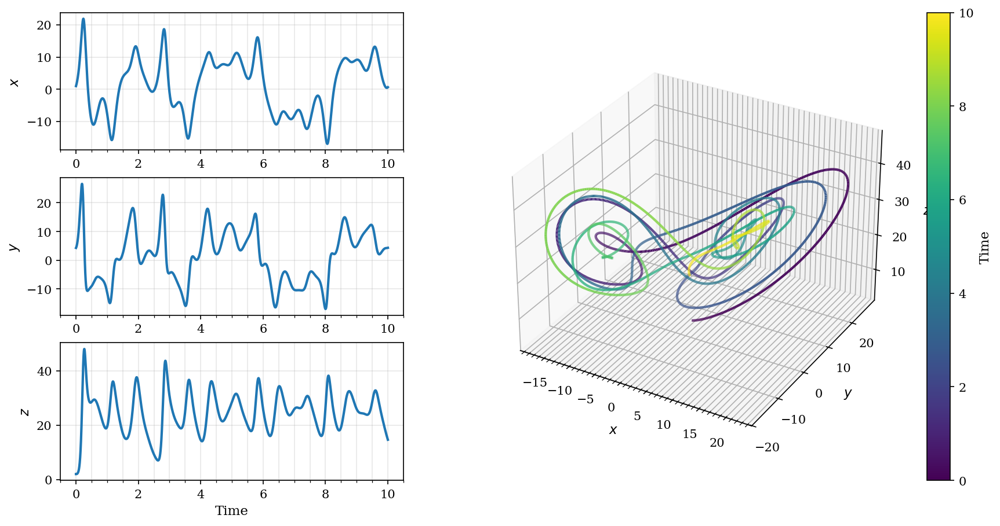

In [2]:
# Define an arbitrary control input
u_func = lambda t: 50*np.sin(10*t)

# Define system setup
dt: float = 1e-3
tFinal: float = 10

# Simulate the system
t, x = rk4(
    lorenz_control, tFinal, np.random.uniform(-10,10,(3,)), dt,
    (u_func,)
)

# Visualize the system
visualize_ode_3d(x, t)

We may identify the potentially nonlinear function $f$ using the same SINDy method with an extension to its candidate function library. Let us collect the data in the following matrices

$$
\begin{aligned}
    X &= \begin{bmatrix}
        x_1(t_1) & x_2(t_1) & \dots & x_n(t_1) \\
        x_1(t_2) & x_2(t_2) & \dots & x_n(t_2) \\
        \vdots & \vdots & \ddots & \vdots \\
        x_1(t_m) & x_2(t_m) & \dots & x_n(t_m)
    \end{bmatrix}, \\
    \dot{X} &= \begin{bmatrix}
        \dot{x}_1(t_1) & \dot{x}_2(t_1) & \dots & \dot{x}_n(t_1) \\
        \dot{x}_1(t_2) & \dot{x}_2(t_2) & \dots & \dot{x}_n(t_2) \\
        \vdots & \vdots & \ddots & \vdots \\
        \dot{x}_1(t_m) & \dot{x}_2(t_m) & \dots & \dot{x}_n(t_m)
    \end{bmatrix} \text{and} \\
    U &= \begin{bmatrix}
        u_1(t_1) & u_2(t_1) & \dots & u_q(t_1) \\
        u_1(t_2) & u_2(t_2) & \dots & u_q(t_2) \\
        \vdots & \vdots & \ddots & \vdots \\
        u_1(t_m) & u_2(t_m) & \dots & u_q(t_m)
    \end{bmatrix}.
\end{aligned}
$$

The candidate function library should then be extended to include $U$ such that

$$
\Theta(X,U) = \begin{bmatrix}
    | & | & & | \\
    \theta_1(X, U) & \theta_2(X, U) & \dots & \theta_{l}(X, U) \\
    | & | & & |
\end{bmatrix}.
$$

In the case of a polynomial based library, the candidate functions are then

In [3]:
# Define state names
state_names = ['x', 'y', 'z', 'u']

# Theta library
lib, lib_names = poly_lib(np.hstack((x, u_func(t).reshape(-1,1))), 3, False, state_names)
display(Math(', '.join(lib_names)))

<IPython.core.display.Math object>

Once we have constructed $\Theta(X,U)$, the exact same sparse regression process can be repeated to solve

$$ \dot{X} \approx \Theta(X,U) \Xi $$

In [4]:
# Compute time derivative
xdot = ps.FiniteDifference(4)._differentiate(x,t)

# Fit a SINDyc model
xi = stlsq(lib, xdot)

display(Math(print_latex_eqn(xi, state_names[:3], lib_names)))

<IPython.core.display.Math object>

# SINDy-MPC

SINDyc provides a powerful capability in identifying a model for model-based control. [(Kaiser et al, 2018)](https://royalsocietypublishing.org/rspa/article/474/2219/20180335/80039/Sparse-identification-of-nonlinear-dynamics-for) proposed the SINDy-MPC framework which integrates SINDyc with a receding horizon MPC (model predictive controller). MPC is a form of optimal control that uses a model of the system to predict a finite step into the future. It computes a sequence of optimal control inputs that minimizes a cost function at each step, whilst being subjected to system constraints.

At each step $j$, let us formulate an optimization problem

$$
\begin{aligned}
    \min_{\hat{u}(\bullet | x_j)} & \left [
        \underbrace{|| \hat{x}_{j+m_p} - r_{m_p} ||^2_{Q_{mp}}}_{\text{Terminal cost}}
        + \underbrace{\sum^{m_p}_{k=1} || \hat{x}_{j+k} - r_{k} ||^2_Q}_{\text{Running cost}}
        + \sum^{m_c-1}_{k=0} \left (
            \underbrace{|| \hat{u}_{j+k} ||^2_{R_u}}_{\text{Control cost}}
            + \underbrace{|| \Delta \hat{u}_{j+k} ||^2_{R_{\Delta u}}}_{\text{Control step cost}}
        \right)
    \right ] \\
    \text{s.t.} & \quad \hat{x}[k+1] = \hat{F}(\hat{x}[k], \hat{u}[k]), \quad k \in [0, m_p - 1] \\
    & \quad \Delta u_{\min} \le \Delta u_k \le \Delta u_{\max} \\
    & \quad u_{\min} \le u_k \le u_{\max}
\end{aligned}
$$

In this formulation:
| Term | Description |
| :--- | :--- |
| $(\hat{\bullet})$ | Predicted value of $(\bullet)$ by the MPC. |
| $\hat{u}(\bullet \| x_j)$ | A sequence of control inputs sized $\mathbb{R}^{m_c \times q}$ that must be optimized by the MPC. |
| $\|\| \bullet \|\|^2_A $ | Weighted norm by a matrix $A$, expanded as $(\bullet)^T A x(\bullet)$. $A$ must be symmetric and positive-definite. |
| $m_p$ | Prediction horizon. |
| $m_c$ | Control horizon. |
| $r$ | A sequence of $m_p$ number of states that the MPC should track. |
| $\Delta \hat{u}_i$ | The predicted relative step input given by $\Delta \hat{u}_i = \hat{u}_i - \hat{u}_{i-1}$. Note that $\Delta \hat{u}_0$ uses the last real control input $u_{j-1}$. |
| $Q$ | Running cost penalty weight. |
| $Q_{mp}$ | Terminal cost penalty weight. |
| $R_u$ | Control penalty weight. |
| $R_{\Delta u}$ | Control step penalty weight.|

The SINDy-MPC method is implemented in `SINDycMPC` which employs the nonlinear optimizer [CasADI](https://web.casadi.org/), an open-source nonlinaer optimization toolbox, to solve the aforementioned optimization problem.

## Controlling the Lorenz System

Using the previously presented Lorenz system with forcing, an interesting exercise would be to stabilise the chaotic Lorenz trajectory to its origin, by actuating only one of its states whilst subjected to control constraints. We first begin by defining our parameters and fitting a SINDy model to it using the Lorenz system data with `SINDycMPC.fit`.

In [5]:
# Define MPC parameters
Q = 10*np.eye(3)
Qmp = Q
R = 0.01*np.eye(1)
Rdu = 0.01*np.eye(1)
mp = 20
mc = 20
u_min = -60
u_max = 60
du_min = -10
du_max = 10
dt = 0.01

# Create SINDy-MPC object
mpc = SINDycMPC(
    Q, Qmp, R, Rdu,
    mp, mc,
    u_min, u_max,
    du_min, du_max,
    dt=dt
)

# Fit a SINDy model using previous trajectory
mpc.fit(x, t, u_func(t).reshape((-1,1)))
display(Math(mpc.print_str()))

<IPython.core.display.Math object>

Note that similar to fitting a system without controls, a system with controls must have its control signal be excited sufficiently such that the optimizer can identify the correct coefficients. Once we have a reasonably accurate SINDy model, we can then proceed to derive an optimal control scheme using MPC using `SINDycMPC.query`, which solves the receding horizon optimization problem at the queried time step.

In this case, we will set the reference $r$ to zero and let the controller stabilize the system to origin. We may also introduce a small Gaussian noise of standard deviation of $\epsilon$, to test its feedback correction capabilities. 

100%|██████████| 199/199 [00:12<00:00, 16.49it/s]


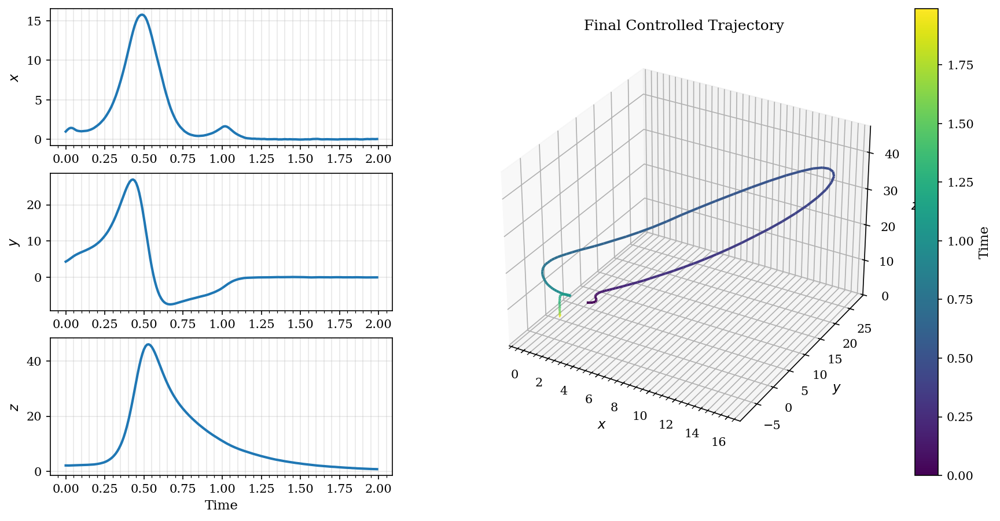

In [6]:
# Set simulation parameter
tFinal: float = 2
epsilon: float = 1e-2

# Initialise time and state vectors
controlled_t: np.ndarray = np.arange(0, tFinal, dt)
controlled_x: np.ndarray = np.empty((len(controlled_t), 3))

# Initialise storage for cost, predicted state and predicted input history of
# the MPC at each step
cost_hist: np.ndarray = np.empty((len(controlled_t)-1,))
x_hat_hist: list[np.ndarray] = list()
u_hist: list[np.ndarray] = list()

# Set the initial condition
controlled_x[0,:] = x[0,:]

# Time step through the time vector and use the control inputs from MPC
for idx, ti in enumerate(tqdm(controlled_t[:-1])):

    u_next, cost, x_hat, u = mpc.query(controlled_x[idx,:], np.zeros((mp,3)))
    cost_hist[idx] = cost
    x_hat_hist.append(x_hat)
    u_hist.append(u.reshape(-1,1))

    controlled_x[idx+1,:] = rk4(
        lorenz_control,
        dt, controlled_x[idx,:], dt,
        (lambda t: u_next,)
    )[1][-1] + np.random.normal(0,epsilon,(1,3))

# Visualize results
visualize_ode_3d(
    controlled_x, controlled_t,
    title='Final Controlled Trajectory'
)
visualize_mpc(
    controlled_x, np.zeros((len(controlled_t),3)), controlled_t,
    cost_hist, x_hat_hist, u_hist,
    title='MPC Optimization during Runtime',
    frame_interval=10
)

> Solving an optimisation problem at every time step can be quite expensive. This can be reduced by using a smaller prediction and control horizon. However, the closed loop system may become unstable if it's too low!

> Try different MPC hyperparameters to get a good sense of the various penalties, and how it influences the optimal solution obtained.

## F-8 Crusader Longitudinal Control

We may also test this on another example, the longitudinal flight control of a F8 crusader from [(Garrard and Jordan, 1977)](https://www.sciencedirect.com/science/article/pii/000510987790070X). The system has the states $[\alpha, \theta, \dot{\theta}]^T$ which are angle of attack (rad), pitch rate (rad/s), pitch (rad) respectively. It also has a single elevator control input $\delta_E$ in radians. The system dynamics is defined by
$$
\begin{aligned}
    \dot{x}_1 &= -0.877x_1 + x_3 - 0.088x_1 x_3 + 0.47x_1^2 - 0.019x_2^2 - x_1^2 x_3 + 3.846x_1^3 - 0.215u + 0.28x_1^2 u + 0.47x_1 u^2 + 0.63u^3 \\
    \dot{x}_2 &= x_3 \\
    \dot{x}_3 &= -4.208x_1 - 0.396x_3 - 0.47x_1^2 - 3.564x_1^3 - 20.967u + 6.265x_1^2 u + 46x_1 u^2 + 61.1u^3.
\end{aligned}
$$

The system is highly nonlinear and coupled as shown. We may begin by first generating a training dataset with the system excited by a sinusoidal input, then fit a SINDyc model on it.

In [7]:
# Define an arbitrary control input
u_func = lambda t: 0.1*np.sin(0.5*t)

# Define system setup
dt: float = 1e-2
tFinal: float = 10

# Simulate the system
t, x = rk4(
    f8_crusader, tFinal, np.array([0.0, 0.0, 0.0]), dt,
    (u_func,)
)

# Define MPC parameters
Q = np.diag([25.0, 0.0, 0.0])
Qmp = Q
R = 0.05*np.eye(1)
Rdu = 0.05*np.eye(1)
mp = 13
mc = 13
u_min = -0.5
u_max = 0.5
du_min = -0.3
du_max = 0.5

# Create SINDy-MPC object
mpc = SINDycMPC(
    Q, Qmp, R, Rdu,
    mp, mc,
    u_min, u_max,
    du_min, du_max,
)

# Fit a SINDy model using previous trajectory
mpc.fit(x, t, u_func(t).reshape((-1,1)))
display(Math(mpc.print_str()))

<IPython.core.display.Math object>

We then proceed to track a reference angle of attack path

$$
r_\alpha(t) = 0.4 \left( \frac{-0.5}{1 + e^{10t - 8}} + \frac{1}{1 + e^{10t - 30}} - 0.4 \right)
$$

that the closed loop system must follow, whilst not penalizing the other two states.

In [8]:
# Define a reference AOA to follow
ref_aoa = lambda t: 0.4 * (
    -0.5/(1+np.exp(10*t - 8))
    + 1/(1+np.exp(10*t - 30))
    - 0.4
)

# Initialise time and state vectors
controlled_t: np.ndarray = np.arange(0, tFinal, dt)
controlled_x: np.ndarray = np.empty((len(controlled_t), 3))
ref_x: np.ndarray = np.empty((len(controlled_t), 3))

# Initialise storage for cost, predicted state and predicted input history of
# the MPC at each step
cost_hist: np.ndarray = np.empty((len(controlled_t)-1,))
x_hat_hist: list[np.ndarray] = list()
u_hist: list[np.ndarray] = list()

# Set the initial condition
controlled_x[0,:] = x[0,:]

# Time step through the time vector and use the control inputs from MPC
for idx, ti in enumerate(tqdm(controlled_t[:-1])):
    
    # Reference state to follow within the next prediction horizon
    ref_state = np.hstack((
        ref_aoa(ti + dt*np.arange(mp)).reshape((-1,1)),
        np.zeros((mp,2))
    ))
    ref_x[idx,:] = ref_state[0,:]

    u_next, cost, x_hat, u = mpc.query(
        controlled_x[idx,:],
        ref_state
    )
    cost_hist[idx] = cost
    x_hat_hist.append(x_hat)
    u_hist.append(u.reshape(-1,1))

    controlled_x[idx+1,:] = rk4(
        f8_crusader,
        dt, controlled_x[idx,:], dt,
        (lambda t: u_next,)
    )[1][-1]

visualize_mpc(
    controlled_x, ref_x, controlled_t,
    cost_hist, x_hat_hist, u_hist,
    title='MPC Optimization during Runtime',
    frame_interval=30
)

100%|██████████| 999/999 [00:11<00:00, 86.31it/s]


As seen, the angle of attack (state $x_1$) has been tracked perfectly. The remaining states were not tracked as their penalty weights are set to zero. Additionally, all three states could not be tracked simultaneously as any changes in angle of attack would alter the pitch rate of the aircraft.

In this tutorial, we have introduced
1. SINDy with controls (SINDyc) by appending additional control/parameter terms within the candidate function library
2. The SINDy-MPC architecture which integrates MPC with SINDy.